<div style="background-color:	#880E4F ; text-align:center; vertical-align: middle; padding:40px 0; margin-top:30px">
<h1 style="color:white">Deep Learning - Transforming Fashion</h1>
<b style="color:black"> Kaggle: Yoyoyoghurt(teamnaam), JortAkershoek, juliaboschman, Sam Keesen </b>
   
<b style="color:white"> Jort Akershoek, Julia Boschman, Sam Keesen</b>
    </div>

<a name='start'></a>

## Table of contents

1. [H1: Inleiding](#1.0)
2. [H2: EDA](#2.0)
    - [&sect;2.1: Afbeeldingen en hun bounding-boxes](#2.1)
    - [&sect;2.2: Categorieën](#2.2)
    - [&sect;2.3: Afbeeldingen image-captioning](#2.3)
    - [&sect;2.4: Gemeenschappelijke items](#2.4)
    - [&sect;2.5: Conclusie EDA](#2.5)
3. [H3: Object Detectie](#3.0)
    - [&sect;3.1: Model](#3.1)
    - [&sect;3.2: Voorspellingen](#3.2)
    - [&sect;3.3: Afbeeldingen voorverwerken](#3.3)
    - [&sect;3.4: Stappen feature engineering](#3.4)
    - [&sect;3.5: Keuzes parameters, optimizer en epochs](#3.5)
    - [&sect;3.6: Loss functie](#3.6)
4. [H4: Ondertiteling van afbeeldingen](#4.0)
    - [&sect;4.1: Finetuning model](#4.1)
    - [&sect;4.2: Uitleg model](#4.2)
    - [&sect;4.3: Keuzes parameters, optimizer en epochs](#4.3)
5. [H5: Beeldgeneratie](#5.0)
    - [&sect;5.1: Hugging Face Model](#5.1)
    - [&sect;5.2: Naam modelarchitectuur en dataset](#5.2)
    - [&sect;5.3: Stappen finetunen](#5.3)
    - [&sect;5.4: Componenten model](#5.4)
    - [&sect;5.5: Afbeeldingen maken en loss functie](#5.5)
    - [&sect;5.6: Keuzes parameters, optimizer en epochs](#5.6)
6. [H6: Implementatie](#6.0)
    - [&sect;6.1: App](#6.1)
    - [&sect;6.2: Uitleg werking app](#6.2)
    - [&sect;6.3: Kaggle scores](#6.3)
7. [H7: Conclusie en aanbevelingen](#7.0)
    - [&sect;7.1: Uitdagingen en omschrijving modelleringsproces](#7.1)
    - [&sect;7.2: Aanbevolen gebruik](#7.2)
    - [&sect;7.3: Aanbevelingen soort data](#7.3)
    - [&sect;7.4: Resultaten betrouwbaar?](#7.4)
8. [H8: Literatuurlijst](#8.0)

In [ ]:
#alle !pip installs
# !pip install git+https://github.com/huggingface/diffusers
# !pip install accelerate
# !pip install datasets
# !pip install peft

In [ ]:
#alle nodige imports
import os
import cv2
import torch
import pandas as pd
from PIL import Image
import tensorflow as tf
from ultralytics import YOLO
import matplotlib.pyplot as plt
from torchvision import transforms
from peft import LoraConfig, get_peft_model
from diffusers import AutoPipelineForText2Image
from torch.utils.data import DataLoader, Dataset
from datasets import load_dataset, Dataset, DatasetDict
from transformers import ViTFeatureExtractor, VisionEncoderDecoderModel, AutoProcessor, ViTImageProcessor, pipeline, AutoTokenizer, get_linear_schedule_with_warmup

[Back to the top](#start)
<a name='1.0'></a>

<div style="background-color:#880E4F; text-align:center; vertical-align:middle; padding:10px 0; margin-top:5px; margin-bottom:5px">
        <h2 style="color:white"><strong>H1: Inleiding</strong></h2>
</div>

Voor het vak Deep Learning wordt er in dit portfolio onderzoek gedaan naar de werking en toepassing van verschillende vormen van neurale netwerken. De opdracht voor dit portfolio is het voorspellen van categorieën in kledingstukken met de hulp van neurale netwerken. Dit kunnen neurale netwerken zijn die alleen werken met tekst data, juist alleen met foto data of zelfs met beide. De opdrachten die worden uitgevoerd in dit portfolio zijn:

- Objectdetectie
- Ondertiteling van afbeeldingen
- Beeldgeneratie
- Implementatie

Aan het einde van het Notebook reflecteren wij op de wijze van ons werk en geven wij advies over het gebruiken van onze gemaakte app.

Een link naar de github van ons notebook: [GitHub](https://github.com/juliaboschman/Deep-Learning-Portfolio)

[Back to the top](#start)
<a name='2.0'></a>

<div style="background-color:#880E4F; text-align:center; vertical-align:middle; padding:10px 0; margin-top:5px; margin-bottom:5px">
        <h2 style="color:white"><strong>H2: EDA</strong></h2>
</div>

<a name='2.1'></a>
<h3>&sect;2.1: Afbeeldingen en hun bounding-boxes</h3>

In [ ]:
def read_bbox_from_file(file_path):
    """
    Reads bounding box data from a file and returns it as a list of bounding boxes.
    The file is expected to have one bounding box per line in the following format:
    class_label, x_center, y_center, width, height

    Parameters:
    -----------
    file_path (str): The path to the file containing bounding box data.

    Returns:
    --------
    tuple: A tuple containing two elements:
        - A list of bounding boxes. Each bounding box is represented as a list in the format
          [class_label, x_center, y_center, width, height], where class_label is an integer
          and the other values are floats.
        - A set of class labels present in the file.
    """

    with open(file_path, 'r') as file:
        lines = file.readlines()
        bounding_boxes = []
        labels = set()
        for line in lines:
            parts = line.strip().split()
            class_label = int(parts[0])
            x_center, y_center, width, height = map(float, parts[1:])
            bounding_boxes.append([class_label, x_center, y_center, width, height])
            labels.add(class_label)
    return bounding_boxes, labels

def draw_bounding_boxes(image, boxes):
    """
    Draws bounding boxes on an image with labels and colors. The function uses predefined colors
    and label names for different classes to draw the bounding boxes and their corresponding
    labels on the image.

    Parameters:
    -----------
    image (numpy.ndarray): The image on which to draw the bounding boxes. The image should be a numpy
        array.
    boxes (list): A list of bounding boxes. Each bounding box is represented as a list in the format
        [label, x_center, y_center, width, height], where label is an integer and the other
        values are floats representing the normalized coordinates and dimensions of the box.
    """

    label_colors = {
        0: (255, 0, 0),
        1: (0, 255, 0),
        2: (0, 0, 255),
        3: (255, 255, 0),
        4: (255, 0, 255),
        5: (0, 255, 255),
        6: (128, 0, 0),
        7: (0, 128, 0),
        8: (0, 0, 128),
        9: (128, 128, 0)
    }
    label_names = {
        0: "sunglass",
        1: "hat",
        2: "jacket",
        3: "shirt",
        4: "pants",
        5: "shorts",
        6: "skirt",
        7: "dress",
        8: "bag",
        9: "shoe"
    }

    for box in boxes:
        label, x_center, y_center, width, height = box
        image_height, image_width, _ = image.shape
        x1 = int((x_center - width / 2) * image_width)
        y1 = int((y_center - height / 2) * image_height)
        x2 = int((x_center + width / 2) * image_width)
        y2 = int((y_center + height / 2) * image_height)

        color = label_colors[label]
        label_name = label_names[label]

        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        cv2.putText(image, label_name, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)


def find_images_by_categories(category_names):
    """
    Finds and returns one image file path for each specified category name.

    Parameters:
    -----------
    category_names (list): A list of category names to search for.

    Returns:
    --------
    dict: A dictionary where keys are image file paths and values are lists of category names.
    """
    label_names = {
        "sunglass": 0,
        "hat": 1,
        "jacket": 2,
        "shirt": 3,
        "pants": 4,
        "shorts": 5,
        "skirt": 6,
        "dress": 7,
        "bag": 8,
        "shoe": 9
    }

    category_labels = {label_names[name]: name for name in category_names}
    matching_images = {}

    for image_file in os.listdir(output_folder):
        if image_file.endswith('.jpg') or image_file.endswith('.png'):
            label_file = os.path.splitext(image_file)[0].replace('output_', '') + '.txt'
            label_path = os.path.join(labels_folder, label_file)

            if os.path.exists(label_path):
                _, labels = read_bbox_from_file(label_path)
                for label in labels:
                    if label in category_labels:
                        if image_file not in matching_images:
                            matching_images[image_file] = []
                        matching_images[image_file].append(category_labels[label])

    return matching_images

De cel hieronder hoeft maar één keer uitgevoerd te worden, omdat het een nieuwe map aan maakt. Wanneer deze map al bestaat is het dus niet meer nodig om deze cel uit te voeren!

In [ ]:
images_folder = f'C:\\Users\\akers\\OneDrive\\Documenten\\Train\\images\\'
labels_folder = f'C:\\Users\\akers\OneDrive\\Documenten\\Train\\labels\\'
output_folder = f'C:\\Users\\akers\\OneDrive\\Documenten\\Train\\output\\'

# if not os.path.exists(output_folder):
#     os.makedirs(output_folder)

# for image_file in os.listdir(images_folder):
#     if image_file.endswith('.jpg') or image_file.endswith('.png'):
#         image_path = os.path.join(images_folder, image_file)
#         image = cv2.imread(image_path)

#         label_file = os.path.splitext(image_file)[0] + '.txt'
#         label_path = os.path.join(labels_folder, label_file)

#         if os.path.exists(label_path):
#             bounding_boxes, _ = read_bbox_from_file(label_path)
#             draw_bounding_boxes(image, bounding_boxes)
#             output_path = os.path.join(output_folder, 'output_' + image_file)
#             cv2.imwrite(output_path, image)

# print("All images processed. Output images saved to 'output' folder.")

Met de functies hierboven maken wij een nieuwe map aan die alle foto's bevat inclusief bounding boxes. In de cellen hieronder geven wij een aantal van deze foto's weer.

In [ ]:
img_directory = f'C:\\Users\\akers\\OneDrive\\Documenten\\Train\\output\\'
image_size = (600, 400)
batch_size = 4

image_dataset = tf.keras.utils.image_dataset_from_directory(
    img_directory,
    label_mode=None,
    image_size=image_size,
    batch_size=batch_size
)

image_file_paths = image_dataset.file_paths

Found 2145 files belonging to 1 classes.


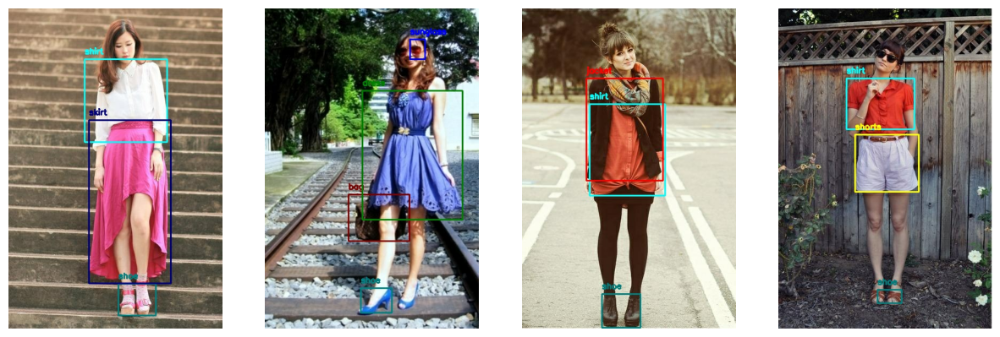

In [ ]:
image_iterator = iter(image_dataset)
batch_images = next(image_iterator)

num_images_to_display = 4

plt.figure(figsize=(15, 8))
for i in range(num_images_to_display):
    plt.subplot(1, num_images_to_display, i + 1)
    plt.imshow(batch_images[i].numpy().astype("uint8"))
    plt.axis("off")
plt.show()

<a name='2.2'></a>
<h3>&sect;2.2: Categorieën</h3>

- 0 = sunglass
- 1 = hat
- 2 = jacket
- 3 = shirt
- 4 = pants
- 5 = shorts
- 6 = skirt
- 7 = dress
- 8 = bag
- 9 = shoe

In [ ]:
category_names = ["sunglass", "hat", "jacket", "shirt", "pants", "shorts", "skirt",
                  "dress", "bag", "shoe"]
matching_images = find_images_by_categories(category_names)

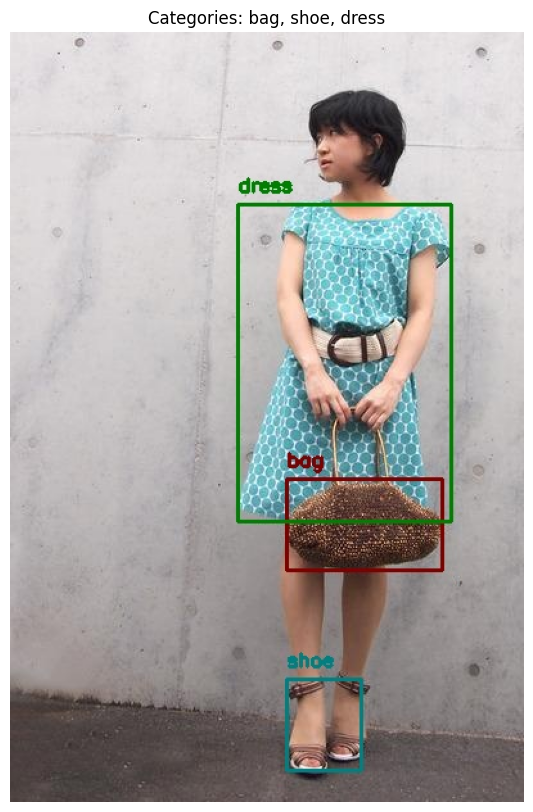

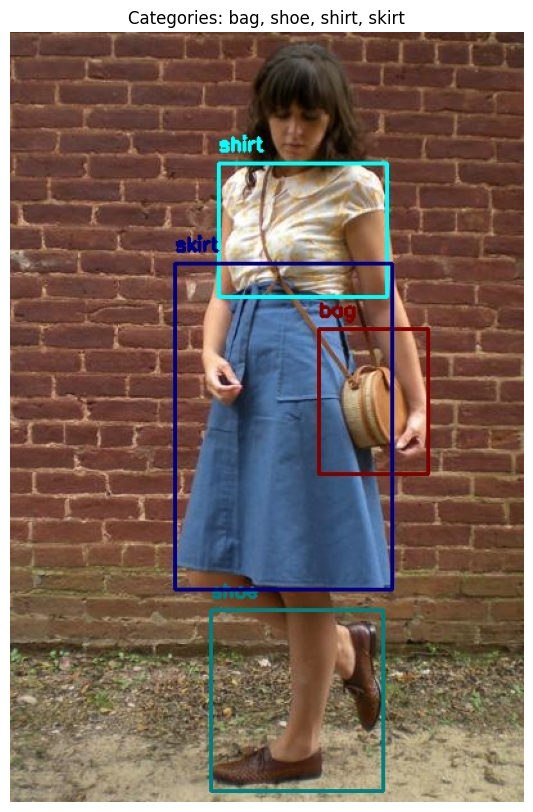

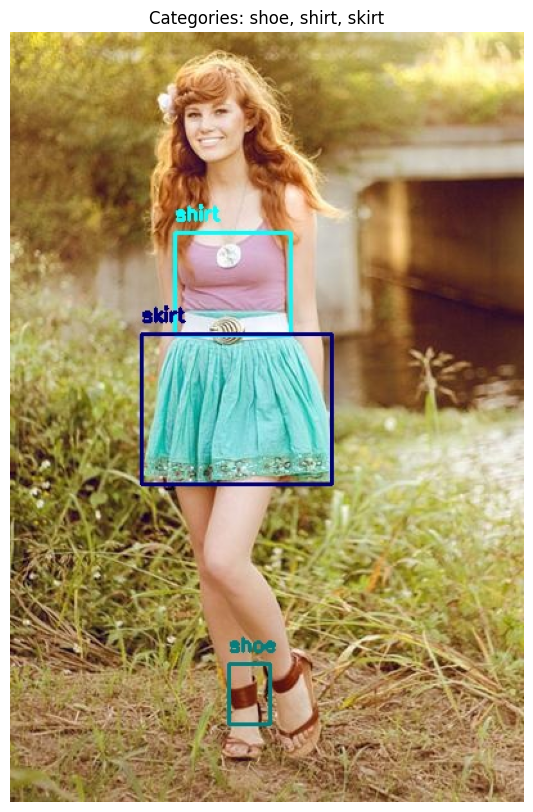

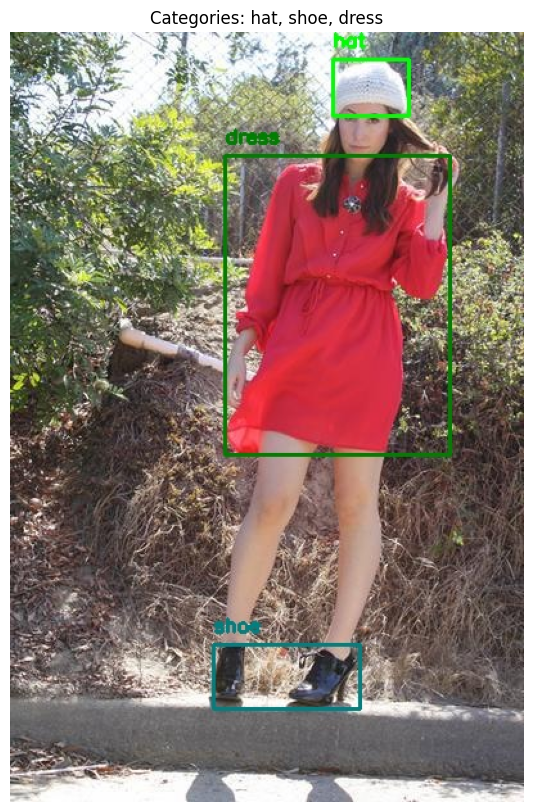

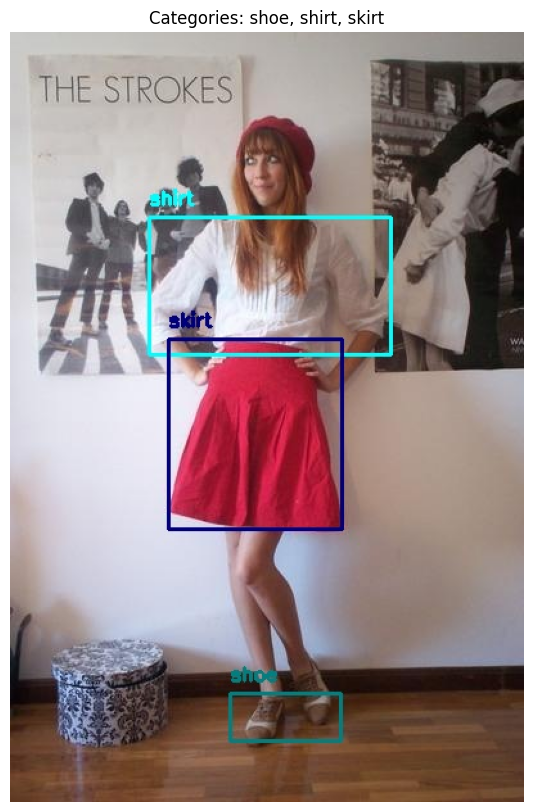

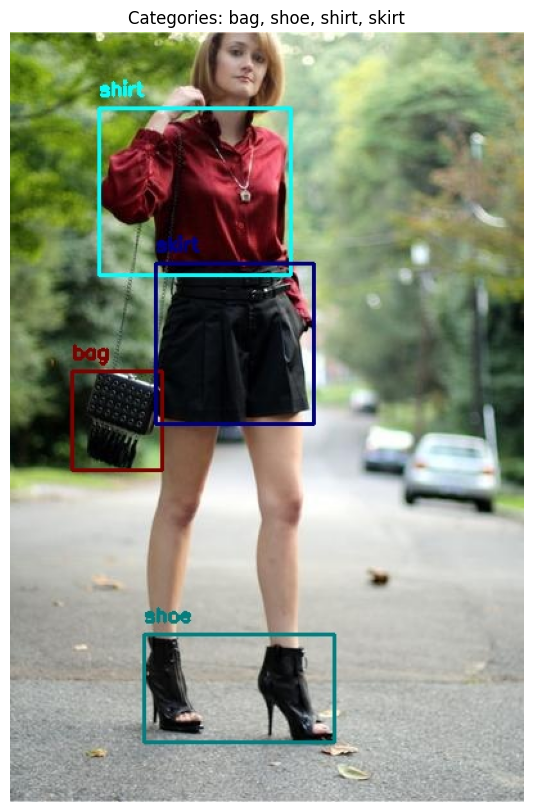

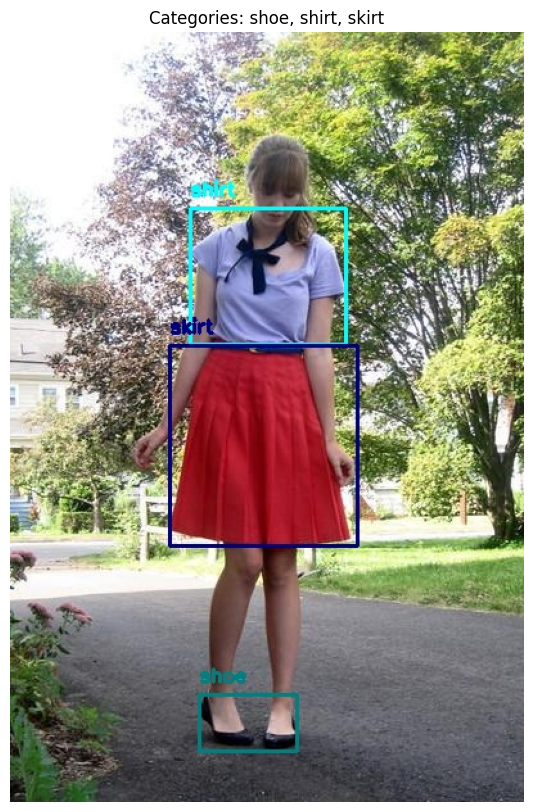

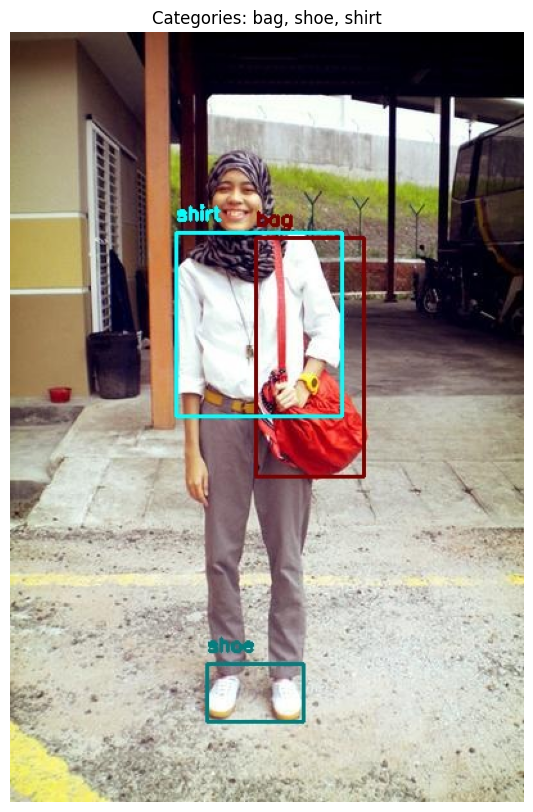

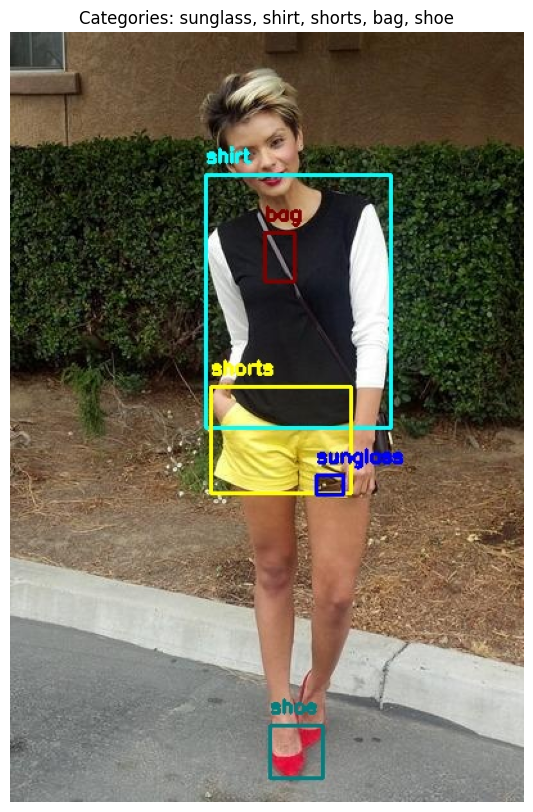

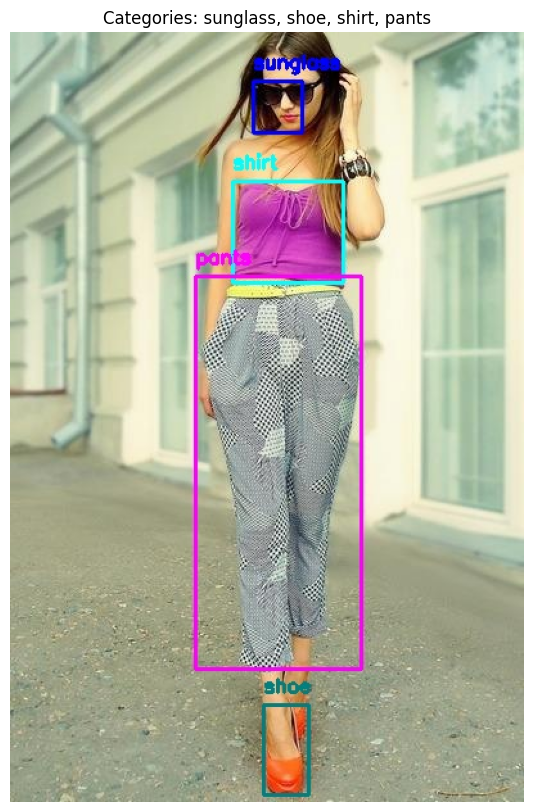

In [ ]:
count = 0
max_images = 10
for image_file, categories in matching_images.items():
    image_path = os.path.join(output_folder, image_file)
    image = cv2.imread(image_path)
    if image is not None:
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(10, 10))
        plt.imshow(image_rgb)
        plt.title(f'Categories: {", ".join(categories)}')
        plt.axis('off')
        plt.show()

        count += 1
        if count >= max_images:
            break

Het valt op dat de meeste schoenen in de dataset worden gerepresenteerd door hakken of sandalen. Het zou dus kunnen dat sneakers moeilijker te herkennen zijn als schoenen. Ook valt het op dat sommige bounding boxes van tassen staan op de "strap" van de tas in plaats van de tas zelf. Ook zie je enkel handtassen en schoudertassen in de dataset. Dit kan een probleem worden wanneer iemand een rugzak op heeft, die misschien niet herkent wordt als tas. Verder zijn er nu twee foto's weergegeven met een zonnebril waarvan de ene gedragen wordt in het gezicht en de ander in de hand. Dit is goed, omdat er zo niet alleen zonnebrillen op iemands hoofd zitten. De vorm van de zonnebril wordt zo makkelijker herkent, omdat het op meerdere manieren wordt weergegeven.

343 sunglass in the dataset
273 hat in the dataset
765 jacket in the dataset
1461 shirt in the dataset
508 pants in the dataset
395 shorts in the dataset
697 skirt in the dataset
550 dress in the dataset
1188 bag in the dataset
2081 shoe in the dataset


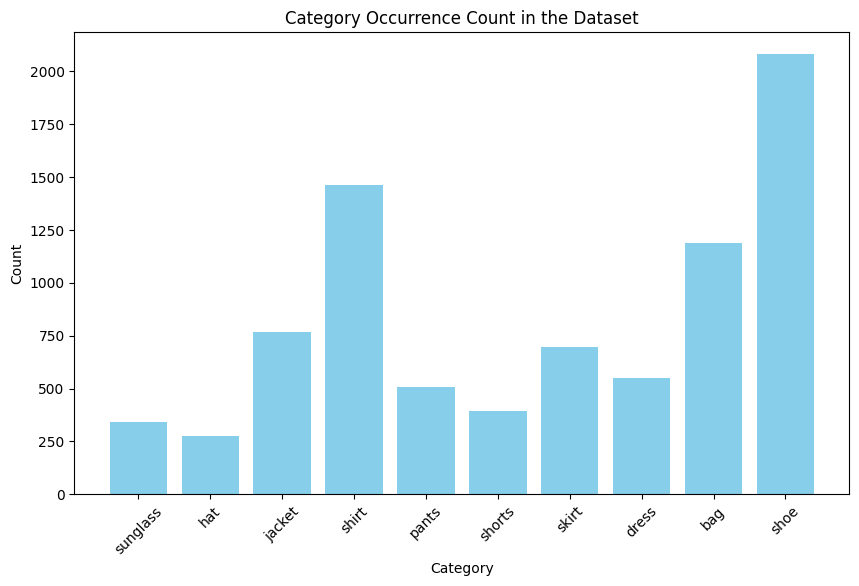

In [ ]:
category_counts = {category: 0 for category in category_names_dataset1}

for categories in matching_images.values():
    for category in categories:
        if category in category_counts:
            category_counts[category] += 1

for category, count in category_counts.items():
    print(f"{count} {category} in the dataset")

plt.figure(figsize=(10, 6))
plt.bar(category_counts.keys(), category_counts.values(), color='skyblue')
plt.xlabel('Category')
plt.ylabel('Count')
plt.title('Category Occurrence Count in the Dataset')
plt.xticks(rotation=45)
plt.show()

Er is te zien dat de data niet hele goed is verdeeld in de foto's. Zo zijn er enkele kleddingstukken die vaker voorkomen dan de ander. Dit is overduidelijk te zien bij de schoenen categorie. Dit komt waarschijnlijk door het feit dat het een dataset is van vrouwen die buien gefotografeerd zijn waarin het hoofd tot aan de voeten zichtbaar is. Zo zien we dan ook dat is bijna iedere foto wel schoenen aanwezig zijn, omdat die door (bijna) iedereen buiten worden gedragen. Daarnaast zien wij ook een hoog aantal bij de rokken en de tassen. Omdat niet iedere categorie evenveel wordt gerepresenteerd in de data zou het kunnen dat het object detectie model uiteindelijk minder goede voorspellingen maakt op de categorieën die minder vaak in de trainingsdata voorkomen.

<a name='2.3'></a>
<h3>&sect;2.3: Afbeeldingen image-captioning</h3>

In [ ]:
dataset = load_dataset("tomytjandra/h-and-m-fashion-caption-12k")

Hier laden we de dataset van Hugging Face en in de cel hieronder worden een aantal foto's laten zien met hun bijbehorende captions.

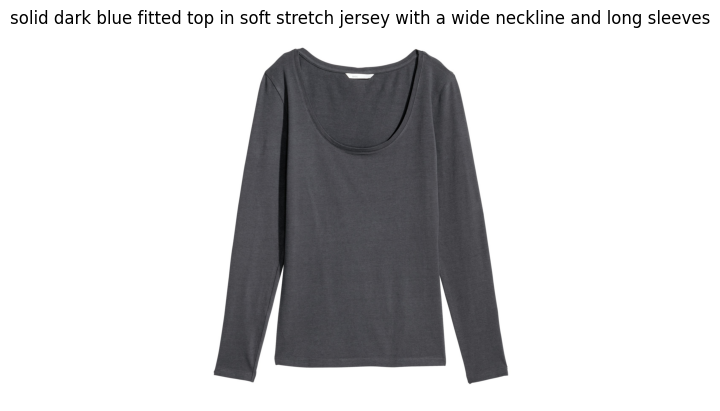

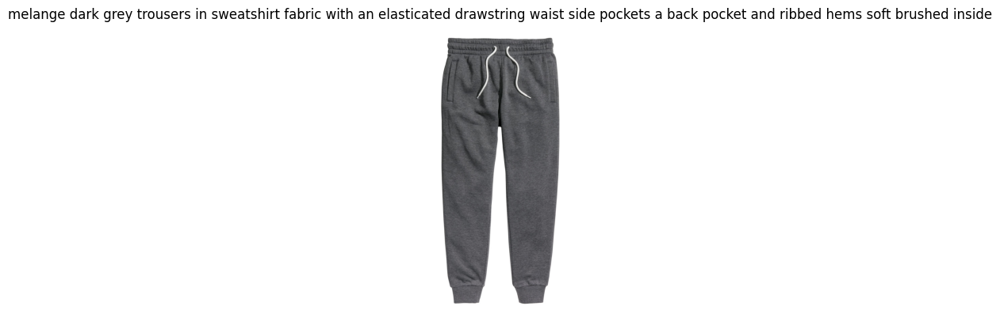

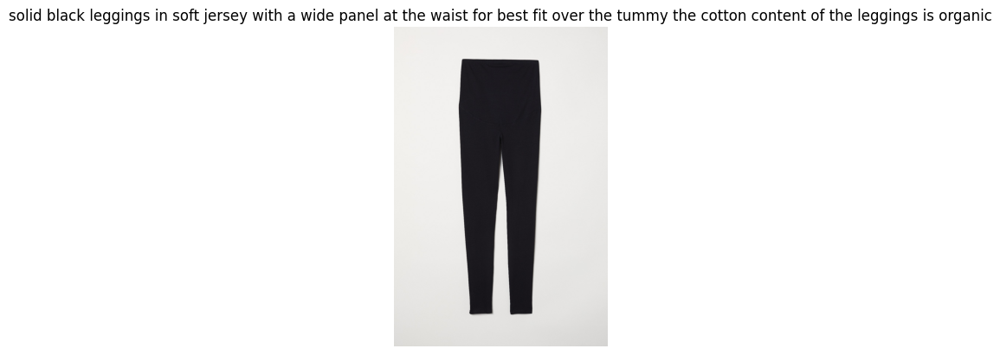

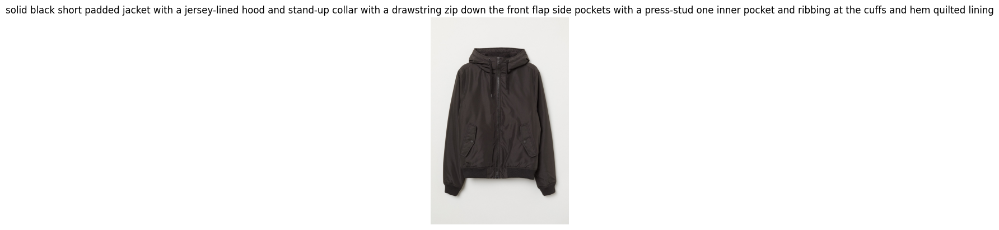

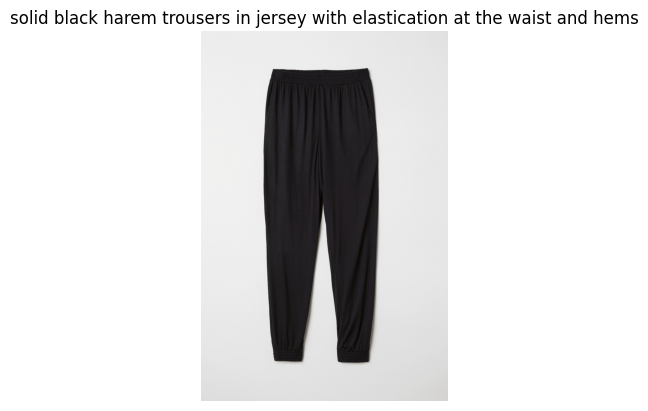

In [ ]:
def display_image_and_caption(example):
    image = example['image'].convert("RGB")
    caption = example['text']
    plt.imshow(image)
    plt.axis('off')
    plt.title(caption)
    plt.show()

for i in range(5):
    display_image_and_caption(dataset['train'][i])

<a name='2.4'></a>
<h3>&sect;2.4: Gemeenschappelijke items</h3>

Om te kijken of er gemeenschappelijke items aanwezig zijn in de dataset zullen we eerst de teksten bekijken die horen bij de foto's van de Hugging Face dataset. Daarna bekijken we of alle categoriën uit de Kaggle dataset ook aanwezig zijn in de Hugging Face dataset om er achter te komen of er gemeenschappelijke categoriën aanwezig zijn in de datatset.

In [ ]:
descriptions = pd.DataFrame(dataset["train"]["text"])
descriptions

,0
0,solid dark blue fitted top in soft stretch jer...
1,melange dark grey trousers in sweatshirt fabri...
2,solid black leggings in soft jersey with a wid...
3,solid black short padded jacket with a jersey-...
4,solid black harem trousers in jersey with elas...
...,...
12432,all over pattern beige fitted calf-length dres...
12433,all over pattern beige fitted top in jersey wi...
12434,solid black loose-fitting sports vest top in r...
12435,solid black short a-line dress in jersey with ...


sunglass: Not present in Hugging Face dataset, Count: 0
hat: Present in Hugging Face dataset, Count: 538
jacket: Present in Hugging Face dataset, Count: 791
shirt: Present in Hugging Face dataset, Count: 1499
pants: Present in Hugging Face dataset, Count: 6
shorts: Present in Hugging Face dataset, Count: 499
skirt: Present in Hugging Face dataset, Count: 1420
dress: Present in Hugging Face dataset, Count: 2172
bag: Present in Hugging Face dataset, Count: 113
shoe: Not present in Hugging Face dataset, Count: 0


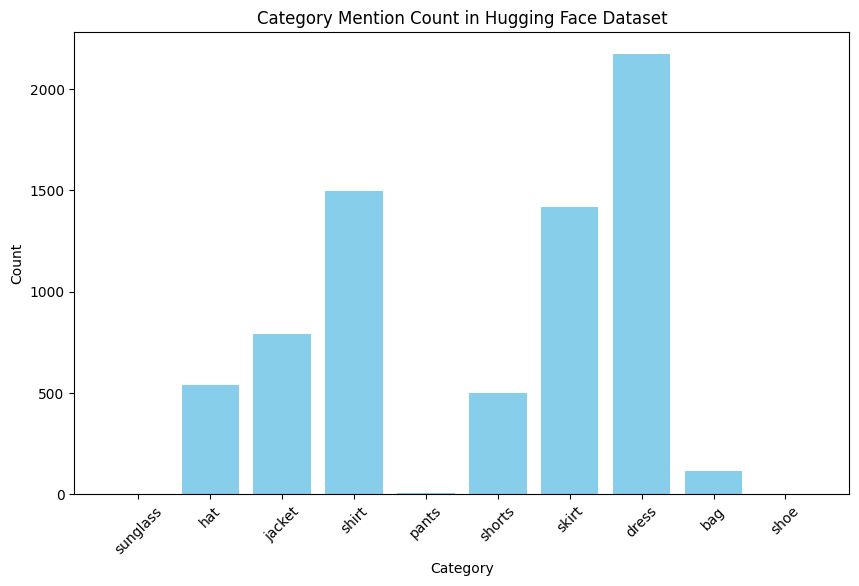

In [ ]:
category_names_dataset1 = ['sunglass', 'hat', 'jacket', 'shirt', 'pants', 'shorts', 'skirt',
                           'dress', 'bag', 'shoe']

all_texts_dataset2 = descriptions[0].values.tolist()

category_presence_count = {}

for category in category_names_dataset1:
    presence = False
    count = 0
    for text in all_texts_dataset2:
        if category.lower() in text.lower():
            presence = True
            count += 1
    category_presence_count[category] = {'presence': presence, 'count': count}

for category, info in category_presence_count.items():
    print(f"{category}: {'Present' if info['presence'] else 'Not present'} in Hugging Face dataset, Count: {info['count']}")

categories = list(category_presence_count.keys())
counts = [info['count'] for info in category_presence_count.values()]

plt.figure(figsize=(10, 6))
plt.bar(categories, counts, color='skyblue')
plt.xlabel('Category')
plt.ylabel('Count')
plt.title('Category Mention Count in Hugging Face Dataset')
plt.xticks(rotation=45)
plt.show()

Er wordt gekeken naar de aanwezigheid van de categoriën uit de Kaggle dataset in de dataset van Hugging Face. We zien dat er twee categoriën zijn die niet in de Hugging Face dataset zitten. Dat is de zonnebril en de schoenen. Alle andere kledingstukken komen voor in beide datasets. Het is dus een goede dataset om te gebruiken, omdat het veel kledingstukken zou moeten herkennen. Wel valt het op dat sommige categorieën meer aanwezig zijn dan de andere. Zo zitten er als nog erg weinig broeken en tassen in de dataset, waardoor deze waarschijnlijk niet heel goed geleerd worden in het train proces van de modellen.

<a name='2.5'></a>
<h3>&sect;2.5: Bevindingen EDA</h3>

Bij het uitvoeren van de EDA hebben we gekeken naar twee verschillende datasets. Een dataset vol met foto's van vrouwen met bounding boxes die aangeven wat er gedragen wordt. En een andere dataset vol met kleding die verkocht wordt bij de H&M. Een groot verschil tussen deze datasets is de afwezigheid van een persoon in de H&M dataset. Dit zijn foto's van een enkel kledingstuk, niet gedragen door een persoon, terwijl de andere dataset foto's bevat van vrouwen die kleding dragen met meerdere categoriën aanwezig in één enkele foto. Het model zal dan ook minder goed werken wanneer het wordt gebruikt voor een foto van een man, omdat deze niet in de dataset aanwezig zijn. Wel zou het model enkele categoriën kunnen herkennen bij een man, omdat een broek altijd gedragen wordt aan de benen en een shirt aan het boven lichaam. Een man in "vrouwelijke" kleding zou beter voorspeld worden. Ook zagen we dat er twee categoriën zijn die niet gemeenschappelijk in beide datasets zitten. Dit zijn de zonnebril en de schoenen. Het zou dus nog lastig kunnen worden om deze twee categoriën goed te voorspellen. Wel zijn de opdrachten gescheiden met het gebruik van data, dus zou dit geen probleem moeten worden. Ook zagen wij dat de categorieën niet geheel goed zijn verdeeld en sommige categorieën vaker aanwezig zijn dan de ander. Het was leuk om te zien dat de ene dataset een van de grootste categorieën als tas had, terwijl de andere dataset juist erg weinig tassen telde. Het zou  kunnen dat er sommige categorieën door deze inbalans niet goed leren in he train proces van de modellen, dus hier moet rekening mee worden gehouden.

[Back to the top](#start)
<a name='3.0'></a>

<div style="background-color:#880E4F; text-align:center; vertical-align:middle; padding:10px 0; margin-top:5px; margin-bottom:5px">
        <h2 style="color:white"><strong>H3: Object detectie</strong></h2>
</div>

# DEZE PARAGRAAF NIET OPNIEUW RUNNEN!!!

<a name='3.1'></a>
<h3>&sect;3.1: Model</h3>

In [ ]:
model = YOLO('yolov5s.pt')
model.train(data='data1.yaml', epochs=10, batch=16, imgsz=416, workers=4)

PRO TIP  Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.

New https://pypi.org/project/ultralytics/8.2.31 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.47  Python-3.9.13 torch-2.2.2+cpu CPU (11th Gen Intel Core(TM) i5-1135G7 2.40GHz)
engine\trainer: task=detect, mode=train, model=yolov5s.pt, data=data1.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=4, project=None, name=train22, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=Fa

train: Scanning C:\Users\bosch\Downloads\Jaar 2\Semester 2\Deep Learning\Portfolio 3\dataset\images_yolo2 - kopie\train
val: Scanning C:\Users\bosch\Downloads\Jaar 2\Semester 2\Deep Learning\Portfolio 3\dataset\images_yolo2 - kopie\val.cac


Plotting labels to runs\detect\train22\labels.jpg... 
'GrouperView' object has no attribute 'join'
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 416 train, 416 val
Using 0 dataloader workers
Logging results to runs\detect\train22
Starting training for 10 epochs...
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10         0G      1.455       2.15      1.386          4        416: 100%|██████████| 108/108 [12:54<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:55

                   all        432       1761      0.631      0.641      0.655      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10         0G        1.3      1.303      1.241          4        416: 100%|██████████| 108/108 [22:02<00:00, 1
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [01:52

                   all        432       1761      0.593      0.676      0.655       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10         0G      1.299      1.239      1.243          3        416: 100%|██████████| 108/108 [23:46<00:00, 1
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [01:52

                   all        432       1761      0.605      0.672      0.667      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10         0G      1.278      1.146      1.226          5        416: 100%|██████████| 108/108 [23:41<00:00, 1
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [01:51

                   all        432       1761      0.631      0.733      0.716      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10         0G      1.243      1.057      1.207          5        416: 100%|██████████| 108/108 [23:44<00:00, 1
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [01:52

                   all        432       1761      0.685      0.709      0.716      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10         0G      1.189     0.9925      1.182          4        416: 100%|██████████| 108/108 [15:09<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [01:01

                   all        432       1761      0.696      0.734      0.755      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10         0G       1.17     0.9331       1.16          5        416: 100%|██████████| 108/108 [13:23<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [01:04

                   all        432       1761      0.674       0.76      0.757      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10         0G      1.126     0.8802      1.135          2        416: 100%|██████████| 108/108 [12:49<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:59

                   all        432       1761      0.733      0.738      0.759      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10         0G      1.096     0.8429      1.124          4        416: 100%|██████████| 108/108 [12:33<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:58

                   all        432       1761      0.798      0.734      0.783      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10         0G      1.067     0.7837      1.099          3        416: 100%|██████████| 108/108 [12:37<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:58

                   all        432       1761      0.706      0.762       0.78      0.514



10 epochs completed in 3.111 hours.
Optimizer stripped from runs\detect\train22\weights\last.pt, 18.5MB
Optimizer stripped from runs\detect\train22\weights\best.pt, 18.5MB

Validating runs\detect\train22\weights\best.pt...
Ultralytics YOLOv8.1.47  Python-3.9.13 torch-2.2.2+cpu CPU (11th Gen Intel Core(TM) i5-1135G7 2.40GHz)
YOLOv5s summary (fused): 193 layers, 9115406 parameters, 0 gradients, 23.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:53


                   all        432       1761      0.705      0.763      0.781      0.514
              sunglass        432         78      0.402      0.128      0.236     0.0724
                   hat        432         83      0.643      0.723      0.748      0.396
                jacket        432        167       0.75      0.844      0.864      0.635
                 shirt        432        316      0.751      0.811       0.83      0.545
                 pants        432        114      0.931      0.947      0.983      0.766
                shorts        432         89      0.693      0.876      0.804      0.512
                 skirt        432        143      0.788      0.831      0.827      0.617
                 dress        432         85      0.651      0.847      0.854      0.647
                   bag        432        264      0.693      0.795      0.811       0.48
                  shoe        432        422      0.751      0.827      0.853      0.469
Speed: 1.3ms preproce

In [ ]:
metrics = model.val(data='data1.yaml')
print(metrics)

Ultralytics YOLOv8.1.47  Python-3.9.13 torch-2.2.2+cpu CPU (11th Gen Intel Core(TM) i5-1135G7 2.40GHz)
YOLOv5s summary (fused): 193 layers, 9115406 parameters, 0 gradients, 23.8 GFLOPs


val: Scanning C:\Users\bosch\Downloads\Jaar 2\Semester 2\Deep Learning\Portfolio 3\dataset\images_yolo2 - kopie\val.cac
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [01:35


                   all        432       1761      0.705      0.763      0.781      0.514
              sunglass        432         78      0.402      0.128      0.236     0.0724
                   hat        432         83      0.643      0.723      0.748      0.396
                jacket        432        167       0.75      0.844      0.864      0.635
                 shirt        432        316      0.751      0.811       0.83      0.545
                 pants        432        114      0.931      0.947      0.983      0.766
                shorts        432         89      0.693      0.876      0.804      0.512
                 skirt        432        143      0.788      0.831      0.827      0.617
                 dress        432         85      0.651      0.847      0.854      0.647
                   bag        432        264      0.693      0.795      0.811       0.48
                  shoe        432        422      0.751      0.827      0.853      0.469
Speed: 2.1ms preproce

In [ ]:
results = model('dataset/images/val/23006.jpg')
results


image 1/1 C:\Users\bosch\Downloads\Jaar 2\Semester 2\Deep Learning\Portfolio 3\dataset\images\val\23006.jpg: 416x288 1 sunglass, 1 skirt, 1 dress, 1 bag, 1 shoe, 149.5ms
Speed: 4.0ms preprocess, 149.5ms inference, 5.3ms postprocess per image at shape (1, 3, 416, 288)


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'sunglass', 1: 'hat', 2: 'jacket', 3: 'shirt', 4: 'pants', 5: 'shorts', 6: 'skirt', 7: 'dress', 8: 'bag', 9: 'shoe'}
 obb: None
 orig_img: array([[[215, 247, 246],
         [218, 252, 252],
         [220, 255, 255],
         ...,
         [233, 244, 255],
         [233, 244, 255],
         [233, 244, 255]],
 
        [[144, 179, 182],
         [127, 165, 169],
         [116, 157, 166],
         ...,
         [116, 130, 152],
         [117, 129, 153],
         [116, 130, 152]],
 
        [[ 88, 132, 139],
         [ 76, 122, 130],
         [ 77, 124, 138],
         ...,
         [ 67,  86, 113],
         [ 69,  85, 114],
         [ 67,  86, 113]],
 
        ...,
 
        [[163, 169, 168],
         [164, 170, 169],
         [164, 170, 169],
         ...,
         [164, 166, 160],
         [180, 182, 176],
         [187, 189, 183]],
 
   

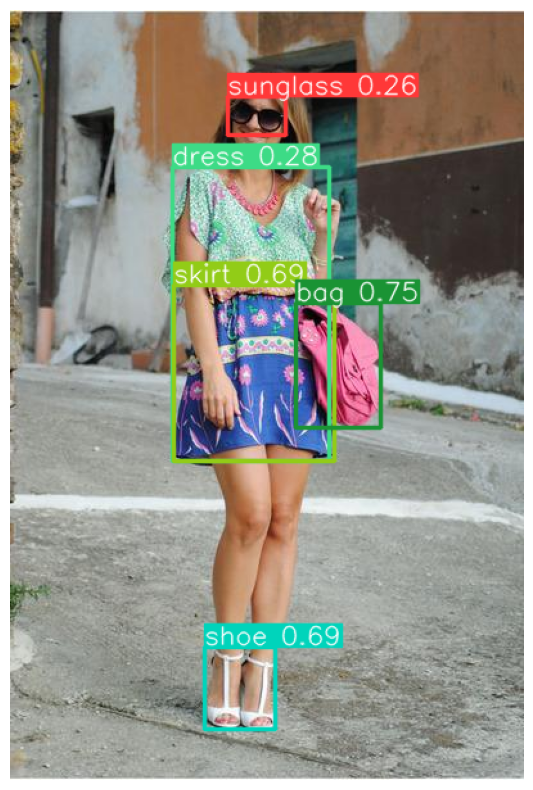

In [ ]:
%matplotlib inline
result = results[0]

img_with_boxes = result.plot(show=False)
img_with_boxes_rgb = cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10))
plt.imshow(img_with_boxes_rgb)
plt.axis('off')
plt.show()

<a name='3.2'></a>
<h3>&sect;3.2: Voorspellingen</h3>

Voor het doen van voorspellingen maken wij voor object detectie gebruik van een YOLO model, wat staat voor You Only Look Once. Als eerste wordt er een bestaand YOLO model geladen genaamd yolov5s, waar de s staat voor small. Dit is een voorgetraind model en wij passen deze aan door een data.yaml bestand in te geven waar onze afbeeldingen en de labels in te vinden zijn. Deze worden meegenomen bij het trainen van het YOLO model zodat hij leert van onze data en betere voorspellingen kan maken. Hoe een YOLO model voorspellingen maakt is, het detecteerd één of meerdere objecten in een afbeelding en voorspelt hiervan de bounding box en de categorie aanwezig. Een YOLO model is erg snel, omdat deze één keer naar een afbeelding kijkt. Tijdens het kijken deelt hij de afbeelding op in rasters en kijkt wat de waarschijnlijkheid is dat er in een raster een object aanwezig is. Er zijn al een aantal verbeteringen op het YOLO model waarvan yolov5 nu de nieuwste is die gebruikt wordt die een hogere nauwkeurigheid heeft bij het maken van voorspellingen. Dit is dan ook de reden dat wij gebruik maken van deze versie van het YOLO model. yolov5 gebruikt een complexere model architectuur die gebasseerd is op EfficientNet, genaamd EfficientDet. Daarnaast is het yolov5 model beter, omdat het 600 categorieën heeft, terwijl een eerste YOLO model maar 20 categorieën kende (R. Kundu, 2024).

De output van een YOLO model is een tensor en ziet er als volgt uit: ((S * S * (B * 5 + C)), waar:
- S * S = Het aantal raster vakken in de afbeelding.
- B = Het aantal voorspelde boundingboxes per rastervak.
- 5 = De informatie voor de bounding-boxes: (x, y, breedte, hoogte) + 1 objectness score.
- C = Het aantal klasse waarschijnlijkheden.

(Hui, 2024)

<a name='3.3'></a>
<h3>&sect;3.3: Afbeeldingen voorverwerken</h3>

De afbeeldingen zijn voorverwerkt door de mappen structuur aan te maken. Zo was het nodig om de afbeeldingen te verdelen tussen train en validation data. Verder is er niks gebeurd met de foto's voordat het model is getraind. Toch zijn er nog een aantal verwerkingsstappen die het model intern uitvoert om de afbeeldingen goed voor te bereiden voor het trainen van het model. Dat zijn de volgende:

- Resizing van Afbeeldingen: Wij hebben in ons YOLOv5 model onze afbeeldingen laten resizen naar 416x416 pixels, omdat alle afbeeldingen de zelfde grootte moeten zijn om gebruik te kunnen maken van het model. Deze waarde van de image size moet een veelvoud zijn van 32 om voor en YOLO model gebruikt te kunnen worden. Waarom wij voor deze waarde hebben gekozen wordt in een aantal cellen hieronder uitgelegd bij de reden voor hyperparmeters

- Normalisatie: Het model zal waarschijnlijk de pixelwaarden van de afbeeldingen normaliseren naar het bereik [0, 1] of [-1, 1]. Dit helpt bij het stabiliseren van de trainingsproces en kan soms worden ingesteld als onderdeel van de configuratie van het trainingsproces.

- Batch Verwerking: Ook hebben wij in het model een batchsize ingegeven wat er voor zorgt dat het model wordt getraind met batches van een ingegeven aantal foto's, zodat het model sneller voorspellingen kan doen in plaats van iedere foto individueel door het model te gooien.

- Loss Berekening: Tijdens het trainingsproces zal het model de voorspellingen vergelijken met de echte annotaties (labels) om de loss te berekenen. Dit proces omvat het verwerken van afbeeldingen om de juiste voorspellingen te genereren en de gradients te berekenen voor backpropagation.

Dus hoewel we  normale, onbewerkte afbeeldingen rechtstreeks in YOLOv5 ingevoert hebben voor training, voert het model intern nog steeds enkele noodzakelijke verwerkingsstappen uit om deze afbeeldingen voor te bereiden en te gebruiken tijdens het optimalisatieproces.

<a name='3.4'></a>
<h3>&sect;3.4: Stappen feature engineering</h3>

Voor het gebruik van het YOLO model zijn er geen specifieke stappen uitgevoerd voor feature engineering. Er is een data.yaml bestand aangemaakt waar alle padden naar de data in gezet zijn, het aantal klasses is beschreven en de labels van de klassen staan. Dit is nodig om het model te fine-tunen op je eigen dataset. Dat is de enige vorm die een beetje aansluit op het uitvoeren van feature engineering. Door het data.yaml bestand in het YOLOv5 model te stoppen kunnen er al goede voorspellingen gemaakt worden van de plaats van de bounding boxes en de labels die de bounding boxes met zich meedragen.

<a name='3.5'></a>
<h3>&sect;3.5: Keuzes parameters, optimizer en epochs</h3>

- Parameters: Er zijn een aantal hyperparameters die wij gebruiken tijdens het trainen van het model. Dit zijn: (data='data1.yaml', epochs=10, batch=16, imgsz=416, workers=4)
    - data: De parameter data bevat een data.yaml bestand waar de verwijzing naar de data wordt omschreven. Hierin staan de paths naar de trainings data en de validatie data, het aantal categorieën waar het model voorspellingen mee moet maken en de namen van deze categorieën.
    - epochs: In deze parameter geven wij het aantal epochs weer die worden gebruikt om het model te trainen. Het is belangrijk dat er een goed balans wordt gevonden tussen het aantal epochs, omdat het model niet underfit, maar ook niet overfit moet zijn. Wij hebben er voor gekozen om het model te trainen met 10 epochs, omdat het model zo genoeg training rondes heeft gezien om de bounding boxes en categorieën te leren, maar het model niet gaat overfitten op de trainingsdata. Daarnaast heeft het model erg veel tijd nodig per epoch, maar toch wilde wij geen underfit model creëren waardoor wij er voor hebben gekozen om meer dan een enkele epoch te trainen.
    - batch: In de parameter "batch" wordt bepaald hoeveel foto's het model tegelijkertijd gebruikt om het model te trainen. Deze batch moet niet te groot zijn, omdat het dan erg lang duurt voordat het model door al deze foto's heen is, maar ook niet al te klein omdat het zo ook lang kan duren. Wij hebben gekozen voor een batchsize van 16, met het aantal trainings afbeeldingen op 1715. Er zijn veel foto's die het model in gaan dus er moet wel een wat grotere batchsize zijn om goed de patronen te leren van de foto's.
    - imgsz: De parameter "imgsz" geeft de mogelijkheid om de grootte van alle afbeeldingen het zelfde te maken wat nodig is om een YOLO model te kunnen runnen. Daarnaast is het bealngrijk dat de grootte van de afbeeldingen een veelvoud is van 32. Wij hebben er voor gekozen om foto's te maken van 416x416 pixels, omdat de afbeeldingen zo niet al te veel kracht gebruiken om te runnen, maar wel duidelijk genoeg zijn om patronen te kunnen herkennen.
    - workers: Als laatste parameter maken wij gebruik van de "workers" parameter. AFMAKEN!!

- Optimizers: Het YOLOv5-model maakt standaard gebruik van de Adam optimizer voor het optimaliseren van de parameters tijdens het trainingsproces. Adam is een populaire optimizer die adaptieve leersnelheden gebruikt en vaak goede resultaten oplevert voor veel machine learning-taken, waaronder objectdetectie zoals bij YOLOv5.

<a name='3.6'></a>
<h3>&sect;3.6: Loss functie</h3>

De loss fuctie die wordt gebruikt bij het evalueren van een objectie model is de mAP (mean average precision) score. Wat de maP berekend is de accurraatheid van de werkelijke bounding box en de voorspelde bounding box. Hoe hoger deze score hoe beter het model. Het model wordt berekend in een aantal stappen. Zo worden eerst de voorspelling gemaakt en deze voorspellingen worden omgezet naar klasses. Daarna wordt de confusion matrix, de precision en de recall berekend, waarna de area under de precision-recall curve wordt berekend (Mean Average Precision (MAP): A Complete Guide, z.d.). De average precision wordt daarna berekend wat het gemiddelde is van verschillende precision waardes op verschillende recall niveaus. Hiermee kan de mean average precision uitgerekend worden door de precision scores te pakken van alle klasses en hier het gemiddelde van te pakken. Nogmaals, de loss laat zien dat een model goed werkt als de score hoog is. Wij tellen een mAP50 van 0.78 en een mAP50-95 van 0.51, wat goede resultaten zijn voor een object detectie model. Het verschil tussen de mAP50 en de mAP50-95 is de benchmark van de IoU (Intersection over Unit). Bij mAP50 pakt de metrics een drempelwaarde van een IoU van 0.5 en bij de mAP50-95 pakt de metrics een drempelwaarde van een IoU tussen de 0.5 en 0.95 met stapjes van 0.05 waar het gemiddelde wordt berekend van al deze waardes. Dit verklaard ook waarom de mAP50-95 lager is dan de mAP50 (Arya, 2024).

[Back to the top](#start)
<a name='4.0'></a>

<div style="background-color:#880E4F; text-align:center; vertical-align:middle; padding:10px 0; margin-top:5px; margin-bottom:5px">
        <h2 style="color:white"><strong>H4: Ondertiteling van afbeeldingen</strong></h2>
</div>

<a name='4.1'></a>
<h3>&sect;4.1: Finetuning model</h3>

In [ ]:
#ervoor zorgen dat het model op gpu runt
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#inladen van benodigde data
dataset = load_dataset("tomytjandra/h-and-m-fashion-caption-12k")

In [ ]:
#het maken van een dataset class zodat die gebruikt kan worden voor de dataloader
class ImageCaptioningDataset(Dataset):
    def __init__(self, dataset, transform=None):
        self.dataset = dataset
        self.transform = transform

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        sample = self.dataset[idx]
        text = sample["text"]
        image = sample["image"]

        if isinstance(image, Image.Image):
            if self.transform:
                image = self.transform(image)
        else:
            print("Error: Unexpected image format.")
            return None

        return image, text

In [ ]:
#Het splitsen van de data in train en val
dataset_dict = dataset['train']

seed = 42

dataset_split = dataset_dict.train_test_split(test_size=0.2, seed=seed)

train_data = dataset_split['train']
val_data = dataset_split['test']

print(f"Training data size: {len(train_data)}")
print(f"Validation data size: {len(val_data)}")


Training data size: 9949
Validation data size: 2488


In [ ]:
#de transformatie van de foto data maken, de foto's worden hier geresized, naar een tensor gezet en worden soms willekeurig horizontaal geflipt
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.RandomHorizontalFlip(),
])
#in de zelfgemaakte dataset class
train_dataset = ImageCaptioningDataset(train_data, transform=transform)
val_dataset = ImageCaptioningDataset(val_data, transform=transform)
#in loaders zetten
train_loader = DataLoader(train_dataset, batch_size=30, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=30, shuffle=False)

In [ ]:
#het inladen van het originele model doormiddel van een pipeline
pipe = pipeline("image-to-text", model="Salesforce/blip-image-captioning-base")
pipe.model.to(device)

#inladen juiste tokenizer
tokenizer = AutoTokenizer.from_pretrained("Salesforce/blip-image-captioning-base")

#loss functie maken
loss_fn = torch.nn.CrossEntropyLoss(ignore_index=tokenizer.pad_token_id)

#optimizer maken
optimizer = torch.optim.Adam(pipe.model.parameters(), lr=5e-5)

#training steps berekenen
epochs = 5
total_steps = len(train_loader) * epochs
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=2, gamma=0.1)
# Early stopping
best_val_loss = float("inf")
patience = 3
patience_counter = 0

# Training loop
epochs = 5
for epoch in range(epochs):
    pipe.model.train()
    total_loss = 0.0
    for batch_idx, batch in enumerate(train_loader):
        images, texts = batch
        images = images.to(device)

        tokenized_texts = tokenizer(list(texts), padding=True, truncation=True, return_tensors="pt")
        input_ids = tokenized_texts.input_ids.to(device)
        labels = tokenized_texts.input_ids.to(device).clone()

        labels[:, :-1] = labels[:, 1:].clone()
        labels[:, -1] = tokenizer.pad_token_id
        attention_mask = tokenized_texts.attention_mask.to(device)

        outputs = pipe.model(pixel_values=images, input_ids=input_ids, attention_mask=attention_mask)

        logits = outputs.logits.view(-1, outputs.logits.size(-1))
        labels = labels.view(-1)
        loss = loss_fn(logits, labels)
        total_loss += loss.item()

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if batch_idx % 10 == 0:
            print(f"Epoch [{epoch+1}/{epochs}], Batch [{batch_idx}/{len(train_loader)}], Loss: {loss.item():.4f}")

    avg_train_loss = total_loss / len(train_loader)
    print(f"Epoch {epoch+1}/{epochs}, Average Training Loss: {avg_train_loss:.4f}")

    # Validation loop
    pipe.model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch_idx, batch in enumerate(val_loader):
            images, texts = batch
            images = images.to(device)

            tokenized_texts = tokenizer(list(texts), padding=True, truncation=True, return_tensors="pt")
            input_ids = tokenized_texts.input_ids.to(device)
            labels = tokenized_texts.input_ids.to(device).clone()

            labels[:, :-1] = labels[:, 1:].clone()
            labels[:, -1] = tokenizer.pad_token_id
            attention_mask = tokenized_texts.attention_mask.to(device)

            outputs = pipe.model(pixel_values=images, input_ids=input_ids, attention_mask=attention_mask)

            logits = outputs.logits.view(-1, outputs.logits.size(-1))
            labels = labels.view(-1)
            loss = loss_fn(logits, labels)
            val_loss += loss.item()

    avg_val_loss = val_loss / len(val_loader)
    print(f"Epoch {epoch+1}/{epochs}, Average Validation Loss: {avg_val_loss:.4f}")

    # Early stopping check
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered")
            break

    # Step the scheduler
    scheduler.step()

/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


Epoch [1/5], Batch [0/332], Loss: 5.6277
Epoch [1/5], Batch [10/332], Loss: 2.7620
Epoch [1/5], Batch [20/332], Loss: 2.1261
Epoch [1/5], Batch [30/332], Loss: 1.9173
Epoch [1/5], Batch [40/332], Loss: 1.7266
Epoch [1/5], Batch [50/332], Loss: 1.6254
Epoch [1/5], Batch [60/332], Loss: 1.3636
Epoch [1/5], Batch [70/332], Loss: 1.5087
Epoch [1/5], Batch [80/332], Loss: 1.3350
Epoch [1/5], Batch [90/332], Loss: 1.4003
Epoch [1/5], Batch [100/332], Loss: 1.2501
Epoch [1/5], Batch [110/332], Loss: 1.3001
Epoch [1/5], Batch [120/332], Loss: 1.2976
Epoch [1/5], Batch [130/332], Loss: 1.3262
Epoch [1/5], Batch [140/332], Loss: 1.1560
Epoch [1/5], Batch [150/332], Loss: 1.2324
Epoch [1/5], Batch [160/332], Loss: 1.1827
Epoch [1/5], Batch [170/332], Loss: 1.2151
Epoch [1/5], Batch [180/332], Loss: 1.1972
Epoch [1/5], Batch [190/332], Loss: 1.2164
Epoch [1/5], Batch [200/332], Loss: 1.0743
Epoch [1/5], Batch [210/332], Loss: 1.1509
Epoch [1/5], Batch [220/332], Loss: 1.0999
Epoch [1/5], Batch [23

In [ ]:
#Het opslaan van het model/pipeline
output_dir = '/content/drive/MyDrive/Project_4/Model'
pipe.model.save_pretrained(output_dir)
tokenizer.save_pretrained(output_dir)
print(f"Model saved at: {output_dir}")

In [ ]:
from transformers import BlipForConditionalGeneration, AutoTokenizer, pipeline

pipe = pipeline("image-to-text", model="/content/drive/MyDrive/Project_4/Model")

tokenizer = AutoTokenizer.from_pretrained("/content/drive/MyDrive/Project_4/Model")

In [ ]:

def generate_validation_examples(val_loader, pipe, tokenizer, device):
    pipe.model.eval()
    val_predictions = []

    with torch.no_grad():
        for batch_idx, batch in enumerate(val_loader):
            images, texts = batch
            images = images.to(device)

            tokenized_texts = tokenizer(list(texts), padding=True, truncation=True, return_tensors="pt")

            input_ids = tokenized_texts.input_ids.to(device)
            labels = tokenized_texts.input_ids.to(device).clone()
            labels[:, :-1] = labels[:, 1:].clone()
            labels[:, -1] = tokenizer.pad_token_id
            attention_mask = tokenized_texts.attention_mask.to(device)

            outputs = pipe.model(pixel_values=images, input_ids=input_ids, attention_mask=attention_mask)

            pred_texts = tokenizer.batch_decode(torch.argmax(outputs.logits, dim=-1), skip_special_tokens=True)
            val_predictions.extend(zip(texts, pred_texts))

            if batch_idx == 1:
                break

    return val_predictions


val_examples = generate_validation_examples(val_loader, pipe, tokenizer, device)

for i, (true_text, pred_text) in enumerate(val_examples[:5]):  # Display first 5 examples
    print(f"Example {i+1}")
    print(f"True: {true_text}")
    print(f"Pred: {pred_text}")


Example 1
True: solid black trousers in a crepe weave with a low ribbed waistband and straight wide legs
Pred: solid black trousers in a softepe weave with a high waistbed waistband and wide wide legs with wide jerseys jersey - - - - jerseysrrsesrersseserssrerserssrsrererersseer
Example 2
True: solid black jumper in a soft fine-knit viscose blend with a deep v-neck long sleeves and ribbing around the neckline cuffs and hem
Pred: solid black jumper in a soft fine knit knit viscose blend with a v v - neck long sleeves and ribbing around the neckline cuffs and hem rerer r kniter knit r lining knit rer rer r lining r knit r longerie r r rer r
Example 3
True: solid green ankle-length kaftan in a crepe weave with flounces down the sides and a v-neck with a wide flounced trim rounded hem with a flounced trim and short slits in the sides slightly shorter at the front
Pred: solid green short - length kaftan in a crepe weave with aounces down the front and a v - neck with a concealed flounce tri

Zoals je hierboven ziet, begint het model vaak wel goed met het voorspellen van de 'caption' maar raakt hij het naar een tijdje kwijt, hoezo dit komt weten we niet we hebben veel dingen geprobeerd maar niks heeft gewerkt.

<a name='4.2'></a>
<h3>&sect;4.2: Uitleg model</h3>

Het model waarop we gefinetuned hebben is het Salesforce/blip-image-captioning-base model. Dit model genereert captions for ingevoerde foto's.

**Preprocessing**

Dit doet die door eerst een paar preprocessing stappen uit te voeren op de foto's zodat die de correcte invoereisten heeft voor de transformer. Ook haalt die de bij het finetunen de tekst door een vooraf gemaakte tokenizer om de tekst om te zetten ik tokens.

**Vision Transformer (ViT)**

Daarna wordt de foto door een Vision Transformer (ViT) gehaald. Een vision transformer verdeeld de foto eerst in kleine batches (denk bijvoorbeeld aan 16x16 pixels),. Daarna worden deze patches afgevlakt en omgezet naar lineaire embeddings, dit process heet ook wel Patch Embedding. De patches krijgen ook positionele encodings zodat het model weet in welke volgorde de patches geplaatst moeten worden (dit is natuurlijk belangrijk voor de uiteindelijke foto). Nadat dit allemaal uitgevoerd is worden de patch embeddings met positionele encodings door een reeks transformers gegooid. Hierbij wordt er een set van features gemaakt die visuele informatie van de foto's bevatten.

**Tekstdecoder**

De gemaakt features worden ingevoerd in een tekstdecoder transformer. Deze transformer kan aan de hand van de features reeksen van woorden maken die de afbeeldingen beschrijven. De transformer neemt de features als een soort van context waarbij hij de woorden 1 voor 1 genereert. Hierbij let de transformer zelf op relaties tussen de worden en de visuele features, dit wordt ook wel self-attention en cross-attention genoemd. De uitvoer van deze tekstdecoder is in een vorm van een reeds tokens.

**Postprocessing**

Uiteindelijk worden de reeds tokens weer terug omgezet naar tekst via dezelfde tokenizer die als bij de preprocessing gebruikt is. Hier kunnen ook nog eventuele aanpassing aan de zin gebeuren zoals aanpassingen aan de zinstructuur.

[ChatGPT, 2024, Prompt: Image-to-text model description](https://chatgpt.com/share/3f9d87a4-e2a0-4aa5-893b-c908b86673c2)


<a name='4.3'></a>
<h3>&sect;4.3: Keuzes parameters, optimizer en epochs</h3>

**Parameters:**

De enige echte parameter die we gebruikt hebben is de learning rate 5e-5 en die hebben we genomen omdat het een gebruikelijke learning rate is voor een probleem als dit, hier buiten hebben we nog 2 andere learning rates geprobeerd maar die gaven geen betere resultaten.

De optimizer die we gebruikt hebben is Adam, dit is gebruikelijk voor dit soort model. We hadden nog wel dingen zoals AdamW kunnen proberen. Ook hebben we een learning rate scheduler gebruikt om overfitten tegen te gaan

De lossfunctie is CrossEntropy wat weer gekozen is omdat het gebruikelijk is voor het dergelijke probleem.


We hebben 5 epochs gerunt met early stopping van 3, het fine tunen van een transformer kost niet heel veel epochs omdat het originele model al heel veel data gezien heeft en daardoor al veel weet en kan, je ziet in dit geval dat we waarschijnlijk ook al bij 3 epochs hadden kunnen stoppen want vanaf dat punt veranderd de val loss niet echt meer.



[Back to the top](#start)
<a name='5.0'></a>

<div style="background-color:#880E4F; text-align:center; vertical-align:middle; padding:10px 0; margin-top:5px; margin-bottom:5px">
        <h2 style="color:white"><strong>H5: Beeld generatie</strong></h2>
</div>

<a name='5.1'></a>
<h3>&sect;5.1: Hugging Face model</h3>

In [ ]:
#Het aanwijzen van de benodigde dingen voor de script
import os
os.environ['MODEL_NAME'] = 'runwayml/stable-diffusion-v1-5'
os.environ['DATASET_NAME'] = 'tomytjandra/h-and-m-fashion-caption-12k'


<a name='5.2'></a>
<h3>&sect;5.2: Naam modelarchitectuur en dataset</h3>

Het vooraf getrained model is stable diffusion 1.5, we hebben voor stable diffusion gekozen om dat het een licht model is in de wereld van diffusions waardoor we het op onze computers nog kunnen fine-tunen. Er zijn veel voordelen van het gebruiken van zo'n soort model (transfer learning). De belangerijste voordelen voor ons zijn als volgt:
1. **Data** De transformers zijn allemaal getraind op heel veel data wat wij niet zouden kunnen reproduceren, hierdoor leert het al veel visuele concepten en structurele patronen.
2. **Expertise** De transformer zijn gebouwd door hele teams van experts die gespecialiseerd zijn in de desbetreffende deep learning. Dit zouden wij als een team van 3 studenten nooit kunnen nabootsen laat staan beter maken.
3. **Efficientie** De transformers zijn al getraind op heel veel data en over een lange tijd, als wij dit zouden willen doen zou het ons heel lang de tijd kosten en we zouden er niet eens de benodigde rekenkracht voor hebben.

Het dataset dat we gebruikt hebben is de H&M Fashion caption 12k

<a name='5.3'></a>
<h3>&sect;5.3: Stappen finetunen</h3>

In [ ]:
!accelerate launch train_text_to_image_lora.py \
  --pretrained_model_name_or_path=$MODEL_NAME \
  --dataset_name=$DATASET_NAME --caption_column="text" \
  --center_crop \
  --random_flip \
  --resolution=128 \
  --train_batch_size=140 \
  --num_train_epochs=5 \
  --learning_rate=1e-04 \
  --seed=42 \
  --output_dir="sd-pokemon-model-lora" \
  --validation_prompt="Jumper in a soft, textured-knit cotton blend with long sleeves and ribbing around the neckline, cuffs and hem."

The following values were not passed to `accelerate launch` and had defaults used instead:
	`--num_processes` was set to a value of `1`
	`--num_machines` was set to a value of `1`
	`--mixed_precision` was set to a value of `'no'`
	`--dynamo_backend` was set to a value of `'no'`
To avoid this warning pass in values for each of the problematic parameters or run `accelerate config`.
/usr/local/lib/python3.10/dist-packages/diffusers/models/transformers/transformer_2d.py:34: FutureWarning: `Transformer2DModelOutput` is deprecated and will be removed in version 1.0.0. Importing `Transformer2DModelOutput` from `diffusers.models.transformer_2d` is deprecated and this will be removed in a future version. Please use `from diffusers.models.modeling_outputs import Transformer2DModelOutput`, instead.
  deprecate("Transformer2DModelOutput", "1.0.0", deprecation_message)
2024-06-05 20:26:30.327685: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different num

In [ ]:
#het inladen van het model en een voorbeeld image genereren
pipeline = AutoPipelineForText2Image.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16).to("cuda")
pipeline.load_lora_weights("/content/pytorch_lora_weights.safetensors", weight_name="pytorch_lora_weights.safetensors")
image = pipeline("solid greenish khaki jumper in a soft slub cotton knit with a chest pocket and roll edges around the neckline cuffs and hem").images[0]
image.save("test4.png")

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/diffusers/models/transformers/transformer_2d.py:34: FutureWarning: `Transformer2DModelOutput` is deprecated and will be removed in version 1.0.0. Importing `Transformer2DModelOutput` from `diffusers.models.transformer_2d` is deprecated and this will be removed in a future version. Please use `from diffusers.models.modeling_outputs import Transformer2DModelOutput`, instead.
  deprecate("Transformer2DModelOutput", "1.0.0", deprecation_message)
/usr/local/lib/python3.10/dist-packages/diffusers/models/vq_model.py:20: FutureWarning: `VQEncoderOutput` is deprecated and will be removed in version 0.31. Importing `VQEncoderOutput` from `diffusers.models.vq_model` is deprecated and this will be removed in a future version. Please use `from diffusers.models.autoencoders.vq_model import VQEncoderOutput`, instead.
  deprecate("VQEncoderOutput", "0.31", deprecation_message)
/usr/local/lib/python3.10/dist-packages/diffusers/models/vq_model.py:25: FutureWarning

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


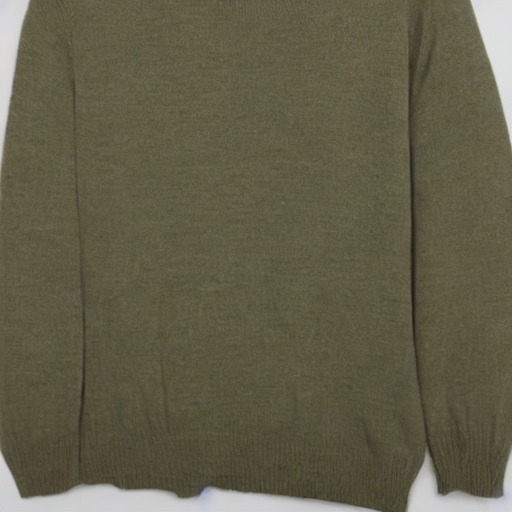

<a name='5.4'></a>
<h3>&sect;5.4: Componenten model</h3>

**De onderdelen van het model**
Het model bestaat uit 3 verschillende onderdelen:
1. Variational autoencoder (VAE) comprimeert de belangerijstke kenmerken van de data en worden samengevat in een 'latent vector', het legt niet precies de kenmerken vast maar laat ruimte over voor variabiliteit. Dit wordt gedaan door dat een kansverdeling van de parameters gemaakt wordt. Je kan het zien alsof het op verschillende manieren ruis wordt toegevoegd op de foto's zodat het model beter en robuuster leert en het inplaats van alleen kopieen te maken ook unieken dingen kan maken.

2. U-Net wat een ResNet backbone heeft, voert forward propagation uit om ruis te verminderen, vervolgens gebruikt het backward propagation om een compacte representatie van de gegevens te verkrijgen. Dit proces is zo belangrijk voor dit soort taken omdat het de datakwaliteit optimaliseert en de details behoudt.

3. De Text Encoder die in dit geval gebruikt wordt is de CLIP ViT-L/14, de text encoder transformeert text naar een embedding space zodat die door de modellen gebruikt kan worden.

Uiteindelijk wordt de VAE decoder nog gebruikt om de compacte representatie van het U-Net om te zetten naar pixels.

(Wikipedia contributors, 2024)

<a name='5.5'></a>
<h3>&sect;5.5: Afbeeldingen maken en loss functie</h3>

**Hoe maakt het foto's?**

Een stable diffusion model maakt foto's door te beginnen met een willekeurig afbeelding met heel veel ruis. Daarna past het model stap voor stap 'inference steps' toe waarbij het ruis steeds wat verminderd en de details steeds duidelijker worden, dit kan je ook wel diffusie (diffusion) noemen. Tijdens elke stap worden specifieke parameters toegepast zodat de foto steeds meer lijkt op de gegeven 'caption'. Deze parameters worden bepaald door verschillende geavanceerde wiskundige technieken om dit zo nauwkeurig mogelijk te maken en fouten in de genereerde foto te verminderen.

(Wikipedia contributors, 2024)

**Loss Functie:**

De loss functie die we voor dit model is gebruikt is MSE, deze loss stond al in het script dus hier hebben we niet veel over nagedacht.
Zo staat het in de script:

```
loss = F.mse_loss(model_pred.float(), target.float(), reduction="mean")

```
De formule van de loss functie MSE ziet er zo uit:
$$ \text{MSE} = \frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2 $$
waarbij:
- $$ n $$ het aantal voorbeelden in de batch is,
- $$ y_i $$ de werkelijke doelwaarde is (de doelafbeelding),
- $$ \hat{y}_i $$ de voorspelde waarde door het model is (de gegenereerde afbeelding).

De functie neemt het gemiddelde van de kwadratische verschillen tussen de werkelijke en voorspelde waarden. Dit betekent dat grote fouten zwaarder worden bestraft omdat de fout kwadratisch wordt geschaald.

[ChatGPT, 2024, Prompt: Text-To-Image Loss Explanation](https://chatgpt.com/share/bd055887-efa7-49aa-84a4-6fead8d43e6f)

<a name='5.6'></a>
<h3>&sect;5.6: Keuzes parameters, optimizer en epochs</h3>

**Uitleg**
Hierin leg ik alle lijnen in de script uit:


```
!accelerate launch train_text_to_image_lora.py \
```
hiermee starten we het lora script

```
--pretrained_model_name_or_path=$MODEL_NAME \
```
De model naam die we gebruiken van hugging face, dit is eerder al aangewezen dus daarom kunnen we $MODEL_NAME gebruiken, in dit geval is dit dus runwayml/stable-diffusion-v1-5

```
--dataset_name=$DATASET_NAME --caption_column="text" \
```
Hetzelfde geval als de lijn erboven maar dan inplaats van model de dataset, in dit geval tomytjandra/h-and-m-fashion-caption-12k. Ook wordt hier de juist column voor captions geselecteerd.



```
--center_crop \
```
Tijdens het data preprocessing worden de afbeelding gecentreerd doormiddel van centrale uitsneden, achteraf was dit misschien niet heel slim want het model genereerd redelijk ingezoomde foto's.



```
--random_flip \
```
De foto's worden tijdens het training process willekeurig gedraaid zodat het model robuuster wordt.



```
--resolution=128 \
```
Resoluties van de foto's dit is beide voor de foto's van fine tunen en de foto's die het later genereerd. De resoluties is dus 128x128. We hebben zo'n lage resolutie gebruikt om rekenkracht te verminderen.



```
--train_batch_size=140 \
```
De hoeveelheid foto's per batch tijdens trainen, de waarde van 140 is imperisch bepaald door te maximaliseren wat de GPU aankon.



```
--num_train_epochs=5 \
```
De hoeveelheid epochs die gerunt worden tijdens trainen, in dit geval 5. De keuze voor 5 is vooral gemaakt op hoelang het trainen zou duren. Omdat via deze script niet heel veel metrics gezien laten worden was het moeilijk om ook echt een goede hoeveelheid epochs te bepalen.



```
--learning_rate=1e-04 \
```
De learning rate van 1e-04 is bepaald omdat het een veel voorkomende learning rate is bij het fine-tunen van zo'n transformer, door de beperkde rekenkracht hebben we niet het fine-tunen kunnen uittesten met verschillende learning rates.



```
--seed=42  \
```
Een seed bepalen, hierdoor kan de training reproduceerd worden.



```
--output_dir="sd-pokemon-model-lora"
```
Een map naam waarin het model wordt opgeslagen



```
--validation_prompt="Jumper in a soft, textured-knit cotton blend with long sleeves and ribbing around the neckline, cuffs and hem."
```
Een validation prompt die tijdens het trainen gebruikt wordt om de fine-tuning the valideren.


[Back to the top](#start)
<a name='6.0'></a>

<div style="background-color:#880E4F; text-align:center; vertical-align:middle; padding:10px 0; margin-top:5px; margin-bottom:5px">
        <h2 style="color:white"><strong>H6: Implementatie</strong></h2>
</div>

<a name='6.1'></a>
<h3>&sect;6.1: App</h3>

In [ ]:
from ultralytics import YOLO
from transformers import BlipForConditionalGeneration, AutoTokenizer, pipeline

pipeline = pipeline("image-to-text", model="C:/Users/akers/OneDrive/Documenten/Model/Model/")
tokenizer = AutoTokenizer.from_pretrained("C:/Users/akers/OneDrive/Documenten/Model/Model/")

def predict_ann(image):
    model = YOLO('C:/Users/akers/Documents/best.pt')
    results = model(image)
    result = results[0]
    img_with_boxes = result.plot(show=False)
    img_with_boxes_rgb = cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB)
    return img_with_boxes_rgb

def predict_caption(image):
    result = pipeline(image)
    return result[0]['generated_text']


FileUpload(value=(), accept='.jpg', description='Upload')


0: 416x288 1 shirt, 2 skirts, 1 dress, 1 bag, 1 shoe, 46.5ms
Speed: 1.5ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 288)


c:\Users\akers\anaconda3\envs\tf\lib\site-packages\transformers\generation\utils.py:1141: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


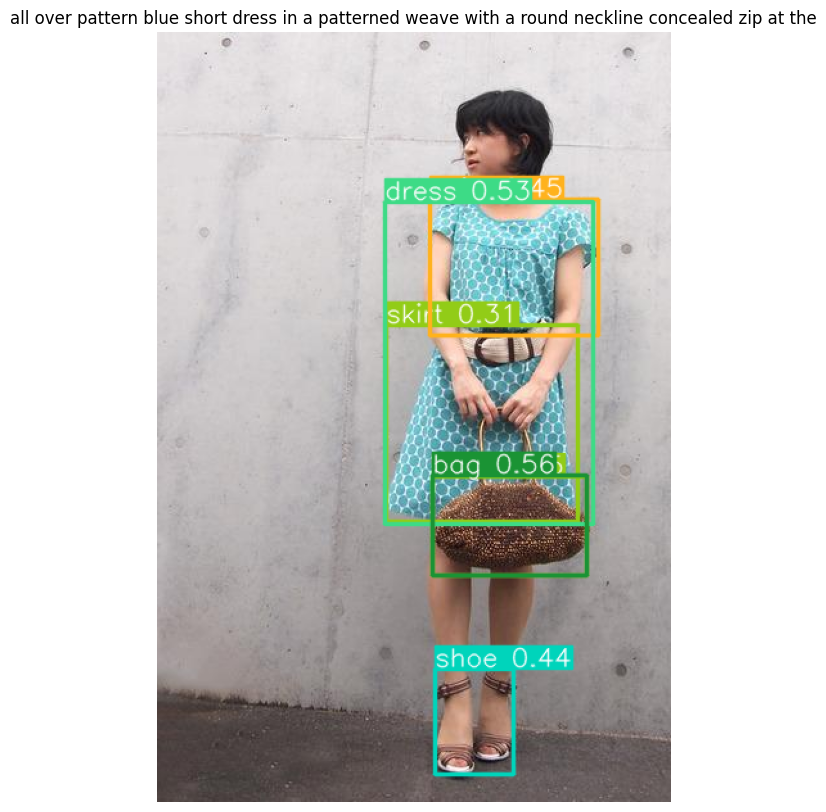


0: 416x288 1 hat, 1 shirt, 1 shorts, 1 shoe, 46.5ms
Speed: 0.5ms preprocess, 46.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 288)


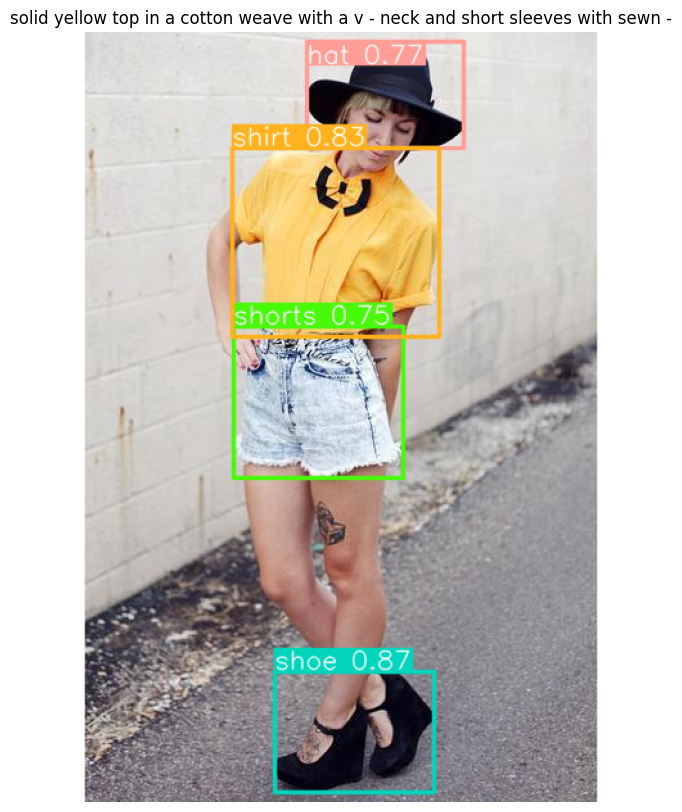

In [ ]:
import ipywidgets as widgets
from IPython.display import display
from PIL import Image as PILImage, ImageDraw
import io

# upload widget maken
upload = widgets.FileUpload(
    accept='.jpg',
    multiple=False
)

def on_upload(change):
    if upload.value:
        # image uploaden
        uploaded_image = upload.value[0]

        # image openen
        image = PILImage.open(io.BytesIO(uploaded_image['content']))

        # voorspel en annoteer de image
        predicted = predict_ann(image)

        text = predict_caption(image)

        # toon de geannoteerde image en de caption
        plt.figure(figsize=(10, 10))
        plt.imshow(predicted)
        plt.axis('off')
        plt.title(text)
        plt.show()

# registreer de event handler
upload.observe(on_upload, names='value')

# toon de upload widget
display(upload)

Deze app werkt door een upload widget aan te maken en daar een foto in te uploaden. Daarna maken we een functie die detecteert of er iets geupload word. Als dit het geval is maken we een prediction met de pre-trained modellen en laten we deze zien.

<a name='6.2'></a>
<h3>&sect;6.2: Uitleg werking app</h3>

Bij het maken van de app gaan wij door enkele stappen heen. Hieronder worden alle stappen beschreven:

1. Laadt modellen voor objectdetectie en beeldbeschrijving.
2. Functie voor objectdetectie.
3. Functie voor beeldbeschrijving.
4. Bestandsupload widget maken en instellen.
5. Event handler voor uploaden:
    - Afbeelding verwerken.
    - Resultaten tonen (geannoteerde afbeelding en beschrijving).
6. Widget weergeven.

<a name='6.3'></a>
<h3>&sect;6.3: Kaggle scores</h3>

Om te kijken hoe goed ons model voorspellingen maakte van de bounding boxes en de klassen die hier in aanwezig waren, is ons model getest in de les. Er was geen Kaggle competitie deze keer, maar we hebben wel kunnen testen hoe goed ons model daadwerkelijk werkte. Hierin hebben wij twee waardes terug gekregen waaruit bleek dat ons object detectie model al redelijk goede voorspellingen kan maken. De resultaten van ons model op ongeziene test data was als volgt: "Jouw model heeft een mAP50 van 0.72 en een mAP50-95 van 0.481 op de test dataset. Mooie resultaten!". Dat wilt zeggen dat ons model met een IoU drempel waarde van 0.5 het model 72% goede voorspellingen maakt. Met een IoU drempelwaarde tussen de 50% en de 95% voorspelt hij als nog 48% wat bijna de helft is. Goed voor een object detectie model.

[Back to the top](#start)
<a name='7.0'></a>

<div style="background-color:#880E4F; text-align:center; vertical-align:middle; padding:10px 0; margin-top:5px; margin-bottom:5px">
        <h2 style="color:white"><strong>H7: Conclusie en aanbevelingen</strong></h2>
</div>

<a name='7.1'></a>
<h3>&sect;7.1: Uitdagingen en omschrijving modelleringsproces</h3>

Voor de laatste portfolio opdracht moesten er verschillende vormen van deep learning worden toegepast die uiteindelijk samen kwamen in een app. Om tot na dit punt te komen moest er redelijk wat gebeuren wat ook uitdagingen met zich mee heeft gebracht:


- Object Detectie: Voor het uitvoeren van object detectie met foto's kan er gebruik gemaakt worden van een voorgetraind model, zoals bijvoorbeeld yolov5s, waar wij gebruik van hebben gemaakt. Wanneer er gebruik wordt gemaakt van een voorgetraind model is het wel belangrijk om te weten hoe deze gebruikt moet worden, omdat je het zelf niet hebt gebouwd. Er zaten wat uitdagingen in het volledig begrijpen van de werking van een yolo model, omdat de output waardes er ook erg anders uit zagen dan ander soort deep learning modellen. Na het trainen van een yolo model is het de bedoeling dat het gefinetunde model wordt opgeslagen om later opnieuw te gebruiken, bijvoorbeeld in de app, waar jou eigen labels in staan in plaats van 80 default labels. Omdat wij in de lessen niet veel aandacht hebben besteed aan het werken met een yolo model wist ik niet goed hoe het model moest worden opgeslagen. Daarnaast duurde het ook lang om het model te runnen, omdat het gauw 30 minuten per epoch kostten. Na het trainen van het model, met 10 epochs in een tijd van 5 uur, is het fijn als het model opgeslagen kan worden, waarvan ik dacht dat er gebruik gemaakt kon worden van model.save("best.pt"). Wanneer ik na het trainen wilde kijken of het model goed was opgeslagen was deze weer terug gegaan naar de default labels en op het internet werd het mij niet duidelijk wat er mis ging. Uiteindelijk kwam ik er achter dat het best.pt mdel automatisch tijdens het trainen werd opgeslagen in een map op mijn computer, waardoor ik gelukkig weer gebruik kon maken van het model, zonder het opnieuw te hoeven trainen.


- Image captioning: Een van de uitdagingen van het maken van het image captioning model was het verschil in train en test data. Hier werden de captions gebruikt van de H&M dataset van HuggingFace en voor het testen worden de foto's gebruikt van de vrouwen. De data is anders weergegeven, omdat er in de H&M dataset alleen kledingstukken zijn weergegeven, zonder mensen die het dragen. Daarom waren er wat uitdagingen in het trainen van een model die niet overfit werd op de soort foto die erin wordt gezet, en dus kan kijken naar zowel foto's van alleen kledingstukken, maar ook foto's van vrouwen met deze kledingstukken aan hun lichaam. Naast de uitdaging hier, kostte het ook weer veel tijd om het model te trainen, en wanneer het blijkt dat het model te overfit is op de ene dataset, moet het model opnieuw getraind worden wat steeds veel tijd kan kosten.


- Beeld generatie: Een uitdaging die vooral naar boven kwam bij het maken van een model voor beeld generatie was het genereren van realistische beelden. Het was vooral een uitdaging, omdat er een dataset werd gebruikt met foto's van alleen kledingstukken om een foto te genereren van een persoon met kleren aan. Na het goed finetunen van het model hebben wij een goede beeld generatie kunnen weg zetten.


- Implementatie: De uitdaging bij het creëren van een app waar de modellen worden geimplementeerd was bijvoorbeeld het goed gebruiken van de modellen. De object detectie en image captioning die wordt gebruikt in de app werden ingezet door de opgeslagen modellen te openen en de foto's door de modellen heen te gooien. Het was nog een kleine uitdaging om uit te zoeken op welke manier de opgeslagen modellen ingeladen moesten worden om correct gebruikt te kunnen worden.

<a name='7.2'></a>
<h3>&sect;7.2: Aanbevolen gebruik</h3>

De modellen die goed gebruikt kunnen worden zijn vooral de object detectie en de beeld generatie. Zo kan het object detectie model gebruikt worden om te achterhalen welke kledingstukken voorkomen in een afbeelding, of te kijken naar de kledingstukken die vaak gedragen worden, om als winkel te weten wat in de mode is. Ook weten wij dat ons object detectie model goed werkt, dus hij zal redelijk goede accurate uitkomsten geven. Het beeld generatie model kan dan weer gebruikt worden voor het bedenken van nieuwe kledingstukken die gemaakt kunnen worden. Het kan zijn dat er een shirt, broek of jurk wordt gegenereerd die nog helemaal niet bestaat. Zo kan er inspiratie gehaald worden uit misschien kleuren combinaties of het model van een kleding stuk.

We hebben ook een image captioning model die gebruikt kan worden, alleen deze voorspelt niet alles goed, met een goed gestructureerde zin. Zo zou bij het gebruik van image captioning met ons model altijd gekeken moeten worden naar de uitkomst van zo'n caption, wat veel tijd gaat kosten en misschien niet de meest efficiënte manier is van het gebruiken van deep learning modellen.

<a name='7.3'></a>
<h3>&sect;7.3: Aanbevelingen soort data</h3>

De aanbevelingen van het soort data wat gebruikt kan worden om onze modellen te gebruiken is dan toch wel een foto van een persoon met kleren aan, het liefste een vrouw. Het kan gebruikt worden om de kleding te identificeren van mannen, maar omdat deze niet in onze trainingsdata verwerkt zijn heeft hij hier niet op geoefend en zal hij niet ieder kledingstuk even goed kunnen classificeren. Het zou kunnen dat een kledingstuk van een man er anders uitziet als datzelfde kledingstuk bij een vrouw. Denk aan een korte broek van een vrouw die vaak een stuk korter is als een korte broek van een man. Daarom zouden wij aanbevelen om foto's te gebruiken die soortgelijk zijn aan de trainingsdata. Wel worden niet ieder kledingstuk even veel gerepresenteerd in de data, waardoor hij de ene klasse beter zou kunnen voorspellen dan de ander.

<a name='7.4'></a>
<h3>&sect;7.4: Resultaten betrouwbaar?</h3>

De modellen die wij hebben gemaakt zijn over het algemeen redelijk betrouwbaar. Zo heeft ons object detectie model een mAP50 score van bijna 0.8 op de train data en ongeveer 0.7 op de testdata. Daarnaast genereert ons beeld generatie model redelijk realistische foto's die altijd gecontroleerd moeten worden door het menselijke oog. Er is hier dus betrouwbaar, omdat je op je eigen interpretatie uit moet gaan van de foto en niet hoeft te kijken naar een score die laat zien of het model goede generaties maakt.

Ons image captioning model is een stuk minder betrouwbaar, omdat het model geen goede volledige zinnen kan maken. Vaak komt het begin van de caption redelijk overheen met wat er te zien is op de afbeeldingen, maar verliest zijn kracht om goede captions te maken nadat de zin langer wordt. De zinnen kunnen dus nooit rechtstreeks gebruikt worden, omdat er geen goede grammaticale zinnen uitkomen en dus zal ik het model niet betrouwbaar noemen om zo te gebruiken. Wel kan het gebruikt worden als hulpmiddel, wanneer er een foto is waarbij het onduidelijk is wat de persoon aanheeft. Misschien kan het model dan een verduidelijking geven door het maken van een caption.

[Back to the top](#start)
<a name='8.0'></a>

<div style="background-color:#880E4F; text-align:center; vertical-align:middle; padding:10px 0; margin-top:5px; margin-bottom:5px">
        <h2 style="color:white"><strong>H8: Literatuurlijst</strong></h2>
</div>

Object Detection:
- Kundu, R. (2024, 10 april). YOLO: Algorithm for Object Detection Explained [+Examples]. V7. https://www.v7labs.com/blog/yolo-object-detection
- Hui, J. (2024, 5 maart). Real-time Object Detection with YOLO, YOLOv2 and now YOLOv3. Medium. https://jonathan-hui.medium.com/real-time-object-detection-with-yolo-yolov2-28b1b93e2088
- Mean Average Precision (MAP): A complete guide. (z.d.). Kili-website. https://kili-technology.com/data-labeling/machine-learning/mean-average-precision-map-a-complete-guide
- Arya, S. (2024, 19 maart). Measuring Success: Comprehensive Evaluation Metrics for Object Detection Models. Analytics Vidhya. https://www.analyticsvidhya.com/blog/2024/02/evaluation-matrix-for-object-detection-using-iou-and-map/

Caption Generation:
- [ChatGPT, 2024, Prompt: Image-to-text model description](https://chatgpt.com/share/3f9d87a4-e2a0-4aa5-893b-c908b86673c2)

Image Generation:
- Wikipedia contributors. (2024, 16 juni). Stable diffusion. Wikipedia. https://en.wikipedia.org/wiki/Stable_Diffusion
- [ChatGPT, 2024, Prompt: Text-To-Image Loss Explanation](https://chatgpt.com/share/bd055887-efa7-49aa-84a4-6fead8d43e6f)